# About Dataset


What is the dataset about?

The data is related to the financial markets of America, for each stock on specific dates, we have a series of information, according 
to which we can analyze the data.

# About this file


Variable Name : Description
    
Date :           specifies trading date,
Open :           opening price ,
High :           maximum price during the day,
Low :            minimum price during the day ,
Close :          close price adjusted for splits,
Adj Close :      The final price ,
Volume :         the number of shares that changed hands during a given day

# What is this project about?


In this project, we are going to analysis the data and identify and remove all types of errors, such as noise and missing data, and after cleaning the data, we will analysis them and reach a general conclusion.


In [1]:
import warnings 
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

## Import Dataset

In [2]:
data = pd.read_csv(r"C:\Users\HP\Desktop\stock_Analysis.csv")

In [3]:
data.head()

,Index,Date,Open,High,Low,Close,Adj Close,Volume
0,NYA,12/31/1965,528.690002,528.690002,528.690002,528.690002,528.690002,0.0
1,NYA,01-03-1966,527.210022,527.210022,527.210022,527.210022,527.210022,0.0
2,NYA,01-04-1966,527.840027,527.840027,527.840027,527.840027,527.840027,0.0
3,NYA,01-05-1966,531.119995,531.119995,531.119995,531.119995,531.119995,0.0
4,NYA,01-06-1966,532.070007,532.070007,532.070007,532.070007,532.070007,0.0


In [4]:
df = pd.DataFrame(data)
df

,Index,Date,Open,High,Low,Close,Adj Close,Volume
0,NYA,12/31/1965,528.690002,528.690002,528.690002,528.690002,528.690002,0.0
1,NYA,01-03-1966,527.210022,527.210022,527.210022,527.210022,527.210022,0.0
2,NYA,01-04-1966,527.840027,527.840027,527.840027,527.840027,527.840027,0.0
3,NYA,01-05-1966,531.119995,531.119995,531.119995,531.119995,531.119995,0.0
4,NYA,01-06-1966,532.070007,532.070007,532.070007,532.070007,532.070007,0.0
...,...,...,...,...,...,...,...,...
112452,N100,5/27/2021,1241.119995,1251.910034,1241.119995,1247.069946,1247.069946,379696400.0
112453,N100,5/28/2021,1249.469971,1259.209961,1249.030029,1256.599976,1256.599976,160773400.0
112454,N100,5/31/2021,1256.079956,1258.880005,1248.140015,1248.930054,1248.930054,91173700.0
112455,N100,06-01-2021,1254.609985,1265.660034,1254.609985,1258.579956,1258.579956,155179900.0


## Data Preparation

In [5]:
 df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112457 entries, 0 to 112456
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Index      112457 non-null  object 
 1   Date       112457 non-null  object 
 2   Open       110253 non-null  float64
 3   High       110252 non-null  float64
 4   Low        110251 non-null  float64
 5   Close      110250 non-null  float64
 6   Adj Close  110244 non-null  float64
 7   Volume     110253 non-null  float64
dtypes: float64(6), object(2)
memory usage: 6.9+ MB


In [6]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,110253.000000,110252.000000,110251.000000,110250.000000,110244.000000,1.102530e+05
mean,7658.561932,7704.538416,7608.129749,7657.740822,7657.982529,1.273975e+09
std,9011.455529,9066.605458,8954.536718,9011.555549,9011.723572,4.315783e+09
min,54.869999,54.869999,54.869999,54.869999,54.869999,0.000000e+00
25%,1855.060059,1864.687470,1844.015015,1855.347473,1855.057556,0.000000e+00
50%,5194.399902,5226.750000,5154.299805,5194.889892,5195.699951,4.329000e+05
75%,10134.299810,10207.827635,10060.369630,10134.867430,10135.512452,1.734314e+08
max,68775.062500,69403.750000,68516.992190,68775.062500,68775.062500,9.440374e+10


- The code is converting a column named 'Date' to datetime format and then extracting only the date part from it, storing it in a new column named 'date'.
- utc=True ensures that the datetime objects are interpreted as UTC (Coordinated Universal Time) time zone. 

In [7]:
df['Date'] = pd.to_datetime(df['Date'], format='mixed', utc=True)
df['date'] = [d.date() for d in df['Date']]
df

,Index,Date,Open,High,Low,Close,Adj Close,Volume,date
0,NYA,1965-12-31 00:00:00+00:00,528.690002,528.690002,528.690002,528.690002,528.690002,0.0,1965-12-31
1,NYA,1966-01-03 00:00:00+00:00,527.210022,527.210022,527.210022,527.210022,527.210022,0.0,1966-01-03
2,NYA,1966-01-04 00:00:00+00:00,527.840027,527.840027,527.840027,527.840027,527.840027,0.0,1966-01-04
3,NYA,1966-01-05 00:00:00+00:00,531.119995,531.119995,531.119995,531.119995,531.119995,0.0,1966-01-05
4,NYA,1966-01-06 00:00:00+00:00,532.070007,532.070007,532.070007,532.070007,532.070007,0.0,1966-01-06
...,...,...,...,...,...,...,...,...,...
112452,N100,2021-05-27 00:00:00+00:00,1241.119995,1251.910034,1241.119995,1247.069946,1247.069946,379696400.0,2021-05-27
112453,N100,2021-05-28 00:00:00+00:00,1249.469971,1259.209961,1249.030029,1256.599976,1256.599976,160773400.0,2021-05-28
112454,N100,2021-05-31 00:00:00+00:00,1256.079956,1258.880005,1248.140015,1248.930054,1248.930054,91173700.0,2021-05-31
112455,N100,2021-06-01 00:00:00+00:00,1254.609985,1265.660034,1254.609985,1258.579956,1258.579956,155179900.0,2021-06-01


In [8]:
correct_date = pd.to_datetime(df['date'],format='%Y-%m-%d').dt.strftime('%m-%d-%Y')

df1 = pd.DataFrame(correct_date)

df['date'] = df1['date'].astype('datetime64[ns]')

df2 = df['date'].dt.year

df['year'] = df2.astype('string')

df

,Index,Date,Open,High,Low,Close,Adj Close,Volume,date,year
0,NYA,1965-12-31 00:00:00+00:00,528.690002,528.690002,528.690002,528.690002,528.690002,0.0,1965-12-31,1965
1,NYA,1966-01-03 00:00:00+00:00,527.210022,527.210022,527.210022,527.210022,527.210022,0.0,1966-01-03,1966
2,NYA,1966-01-04 00:00:00+00:00,527.840027,527.840027,527.840027,527.840027,527.840027,0.0,1966-01-04,1966
3,NYA,1966-01-05 00:00:00+00:00,531.119995,531.119995,531.119995,531.119995,531.119995,0.0,1966-01-05,1966
4,NYA,1966-01-06 00:00:00+00:00,532.070007,532.070007,532.070007,532.070007,532.070007,0.0,1966-01-06,1966
...,...,...,...,...,...,...,...,...,...,...
112452,N100,2021-05-27 00:00:00+00:00,1241.119995,1251.910034,1241.119995,1247.069946,1247.069946,379696400.0,2021-05-27,2021
112453,N100,2021-05-28 00:00:00+00:00,1249.469971,1259.209961,1249.030029,1256.599976,1256.599976,160773400.0,2021-05-28,2021
112454,N100,2021-05-31 00:00:00+00:00,1256.079956,1258.880005,1248.140015,1248.930054,1248.930054,91173700.0,2021-05-31,2021
112455,N100,2021-06-01 00:00:00+00:00,1254.609985,1265.660034,1254.609985,1258.579956,1258.579956,155179900.0,2021-06-01,2021


In [9]:
df3 = df['date'].dt.month
month = []
for i in df3:
    if i == 1:
        month.append("January")
    if i == 2:
        month.append("February")
    if i == 3:
        month.append("March")
    if i == 4:
        month.append("April")
    if i ==5:
        month.append("May")
    if i ==6:
        month.append("June")
    if i ==7:
        month.append("July")
    if i ==8:
        month.append("August")
    if i ==9:
         month.append("September")
    if i ==10:
        month.append("October")
    if i ==11:
        month.append("November")
    if i ==12:
        month.append("December")

df3 = pd.DataFrame(month)
df['month'] = df3
df
        

,Index,Date,Open,High,Low,Close,Adj Close,Volume,date,year,month
0,NYA,1965-12-31 00:00:00+00:00,528.690002,528.690002,528.690002,528.690002,528.690002,0.0,1965-12-31,1965,December
1,NYA,1966-01-03 00:00:00+00:00,527.210022,527.210022,527.210022,527.210022,527.210022,0.0,1966-01-03,1966,January
2,NYA,1966-01-04 00:00:00+00:00,527.840027,527.840027,527.840027,527.840027,527.840027,0.0,1966-01-04,1966,January
3,NYA,1966-01-05 00:00:00+00:00,531.119995,531.119995,531.119995,531.119995,531.119995,0.0,1966-01-05,1966,January
4,NYA,1966-01-06 00:00:00+00:00,532.070007,532.070007,532.070007,532.070007,532.070007,0.0,1966-01-06,1966,January
...,...,...,...,...,...,...,...,...,...,...,...
112452,N100,2021-05-27 00:00:00+00:00,1241.119995,1251.910034,1241.119995,1247.069946,1247.069946,379696400.0,2021-05-27,2021,May
112453,N100,2021-05-28 00:00:00+00:00,1249.469971,1259.209961,1249.030029,1256.599976,1256.599976,160773400.0,2021-05-28,2021,May
112454,N100,2021-05-31 00:00:00+00:00,1256.079956,1258.880005,1248.140015,1248.930054,1248.930054,91173700.0,2021-05-31,2021,May
112455,N100,2021-06-01 00:00:00+00:00,1254.609985,1265.660034,1254.609985,1258.579956,1258.579956,155179900.0,2021-06-01,2021,June


In [10]:
DF = df[['Index','date','year',"month","Open","High","Low", 'Close','Adj Close','Volume']]

In [11]:
DF

,Index,date,year,month,Open,High,Low,Close,Adj Close,Volume
0,NYA,1965-12-31,1965,December,528.690002,528.690002,528.690002,528.690002,528.690002,0.0
1,NYA,1966-01-03,1966,January,527.210022,527.210022,527.210022,527.210022,527.210022,0.0
2,NYA,1966-01-04,1966,January,527.840027,527.840027,527.840027,527.840027,527.840027,0.0
3,NYA,1966-01-05,1966,January,531.119995,531.119995,531.119995,531.119995,531.119995,0.0
4,NYA,1966-01-06,1966,January,532.070007,532.070007,532.070007,532.070007,532.070007,0.0
...,...,...,...,...,...,...,...,...,...,...
112452,N100,2021-05-27,2021,May,1241.119995,1251.910034,1241.119995,1247.069946,1247.069946,379696400.0
112453,N100,2021-05-28,2021,May,1249.469971,1259.209961,1249.030029,1256.599976,1256.599976,160773400.0
112454,N100,2021-05-31,2021,May,1256.079956,1258.880005,1248.140015,1248.930054,1248.930054,91173700.0
112455,N100,2021-06-01,2021,June,1254.609985,1265.660034,1254.609985,1258.579956,1258.579956,155179900.0


#### Rounding the numerical values

In [12]:
DF = round(DF)
DF

,Index,date,year,month,Open,High,Low,Close,Adj Close,Volume
0,NYA,1965-12-31,1965,December,529.0,529.0,529.0,529.0,529.0,0.0
1,NYA,1966-01-03,1966,January,527.0,527.0,527.0,527.0,527.0,0.0
2,NYA,1966-01-04,1966,January,528.0,528.0,528.0,528.0,528.0,0.0
3,NYA,1966-01-05,1966,January,531.0,531.0,531.0,531.0,531.0,0.0
4,NYA,1966-01-06,1966,January,532.0,532.0,532.0,532.0,532.0,0.0
...,...,...,...,...,...,...,...,...,...,...
112452,N100,2021-05-27,2021,May,1241.0,1252.0,1241.0,1247.0,1247.0,379696400.0
112453,N100,2021-05-28,2021,May,1249.0,1259.0,1249.0,1257.0,1257.0,160773400.0
112454,N100,2021-05-31,2021,May,1256.0,1259.0,1248.0,1249.0,1249.0,91173700.0
112455,N100,2021-06-01,2021,June,1255.0,1266.0,1255.0,1259.0,1259.0,155179900.0


## Filtering column Index

In [13]:
FinalDf = DF[DF['Index'] == 'NYA']
FinalDf

,Index,date,year,month,Open,High,Low,Close,Adj Close,Volume
0,NYA,1965-12-31,1965,December,529.0,529.0,529.0,529.0,529.0,0.000000e+00
1,NYA,1966-01-03,1966,January,527.0,527.0,527.0,527.0,527.0,0.000000e+00
2,NYA,1966-01-04,1966,January,528.0,528.0,528.0,528.0,528.0,0.000000e+00
3,NYA,1966-01-05,1966,January,531.0,531.0,531.0,531.0,531.0,0.000000e+00
4,NYA,1966-01-06,1966,January,532.0,532.0,532.0,532.0,532.0,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...
13943,NYA,2021-05-24,2021,May,16375.0,16509.0,16375.0,16465.0,16465.0,2.947400e+09
13944,NYA,2021-05-25,2021,May,16465.0,16526.0,16375.0,16390.0,16390.0,3.420870e+09
13945,NYA,2021-05-26,2021,May,16390.0,16466.0,16388.0,16452.0,16452.0,3.674490e+09
13946,NYA,2021-05-27,2021,May,16452.0,16546.0,16452.0,16532.0,16532.0,5.201110e+09


In [14]:
FinalDf.describe()

,date,Open,High,Low,Close,Adj Close,Volume
count,13948,13947.000000,13946.000000,13945.000000,13944.000000,13938.000000,1.394700e+04
mean,1993-09-24 13:57:54.046458368,4452.144834,4469.313495,4434.260739,4453.026033,4455.093916,1.215565e+09
min,1965-12-31 00:00:00,348.000000,348.000000,348.000000,348.000000,348.000000,0.000000e+00
25%,1979-12-03 18:00:00,655.000000,655.000000,655.000000,655.000000,656.000000,0.000000e+00
50%,1993-09-18 12:00:00,2632.000000,2632.000000,2632.000000,2632.000000,2633.000000,0.000000e+00
75%,2007-07-24 06:00:00,7339.500000,7376.500000,7278.000000,7339.750000,7342.750000,2.681975e+09
max,2021-05-28 00:00:00,16590.000000,16686.000000,16532.000000,16590.000000,16590.000000,1.145623e+10
std,NaN,4074.832916,4094.959937,4052.814928,4075.484621,4075.457549,1.834155e+09


In [15]:
FinalDf.isnull().sum()

Index         0
date          0
year          0
month         0
Open          1
High          2
Low           3
Close         4
Adj Close    10
Volume        1
dtype: int64

In [16]:
FinalDf.shape

(13948, 10)

In [17]:
DF = FinalDf.dropna()

In [18]:
DF.shape

(13932, 10)

In [19]:
DF.isnull().sum()


Index        0
date         0
year         0
month        0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [20]:
DF

,Index,date,year,month,Open,High,Low,Close,Adj Close,Volume
0,NYA,1965-12-31,1965,December,529.0,529.0,529.0,529.0,529.0,0.000000e+00
1,NYA,1966-01-03,1966,January,527.0,527.0,527.0,527.0,527.0,0.000000e+00
2,NYA,1966-01-04,1966,January,528.0,528.0,528.0,528.0,528.0,0.000000e+00
3,NYA,1966-01-05,1966,January,531.0,531.0,531.0,531.0,531.0,0.000000e+00
4,NYA,1966-01-06,1966,January,532.0,532.0,532.0,532.0,532.0,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...
13943,NYA,2021-05-24,2021,May,16375.0,16509.0,16375.0,16465.0,16465.0,2.947400e+09
13944,NYA,2021-05-25,2021,May,16465.0,16526.0,16375.0,16390.0,16390.0,3.420870e+09
13945,NYA,2021-05-26,2021,May,16390.0,16466.0,16388.0,16452.0,16452.0,3.674490e+09
13946,NYA,2021-05-27,2021,May,16452.0,16546.0,16452.0,16532.0,16532.0,5.201110e+09


In [21]:
index_description = DF.Index.describe()
print("Description of the index:")
index_description


Description of the index:


count     13932
unique        1
top         NYA
freq      13932
Name: Index, dtype: object

In [22]:
unique_names = DF['Index'].unique()

# Printing the unique values in the 'Index' column
print("Unique values in the 'Name' column:")
unique_names

Unique values in the 'Name' column:


array(['NYA'], dtype=object)

# noise detection


To identify the noise, the scatter plots of the independent variables have been drawn against the target variable

## Relationship between Open Price and Adjusted Close Price

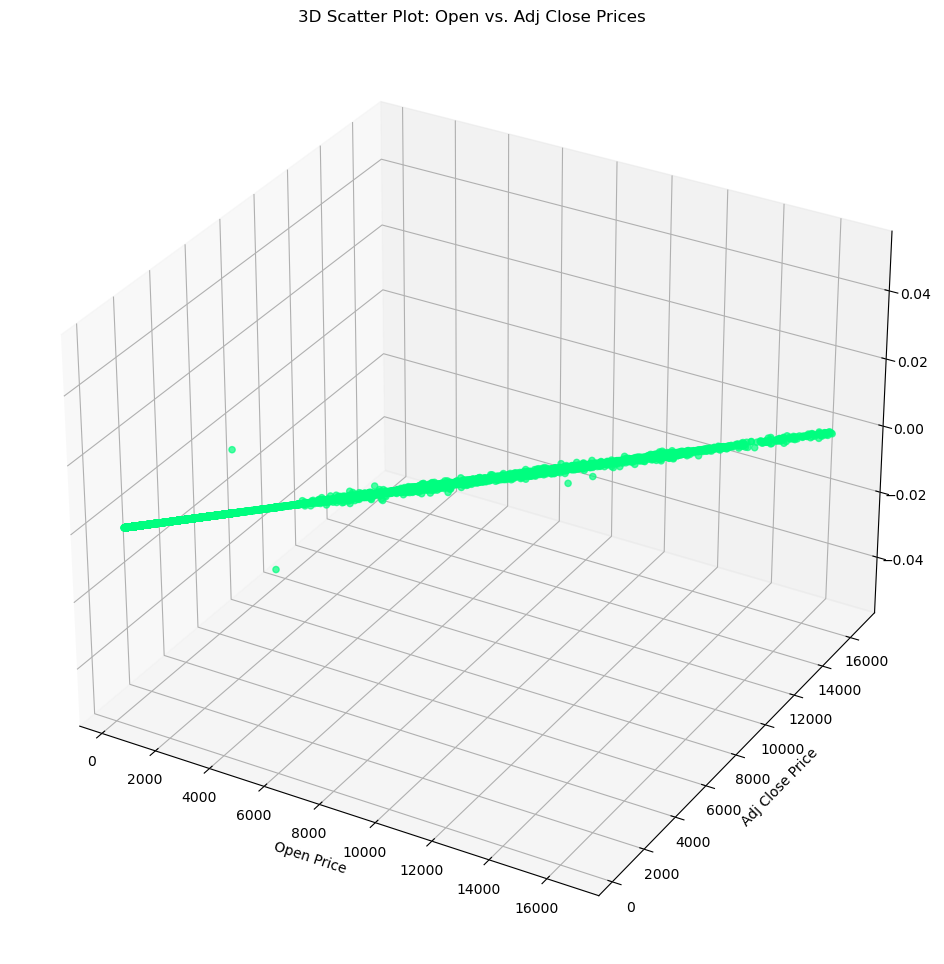

In [23]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot
fig = plt.figure(figsize=(20, 12))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(DF['Open'], DF['Adj Close'], color="springgreen", alpha=0.7)

# Set labels and title
ax.set_xlabel('Open Price')
ax.set_ylabel('Adj Close Price')
ax.set_title('3D Scatter Plot: Open vs. Adj Close Prices')

# Show plot
plt.show()


There are two noise in the graph, and their ranges are as follows: Adj Close>6000 & Open<1000 Adj Close<1000 & Open>5000

## Relationship between High Price and Adjusted Close Price

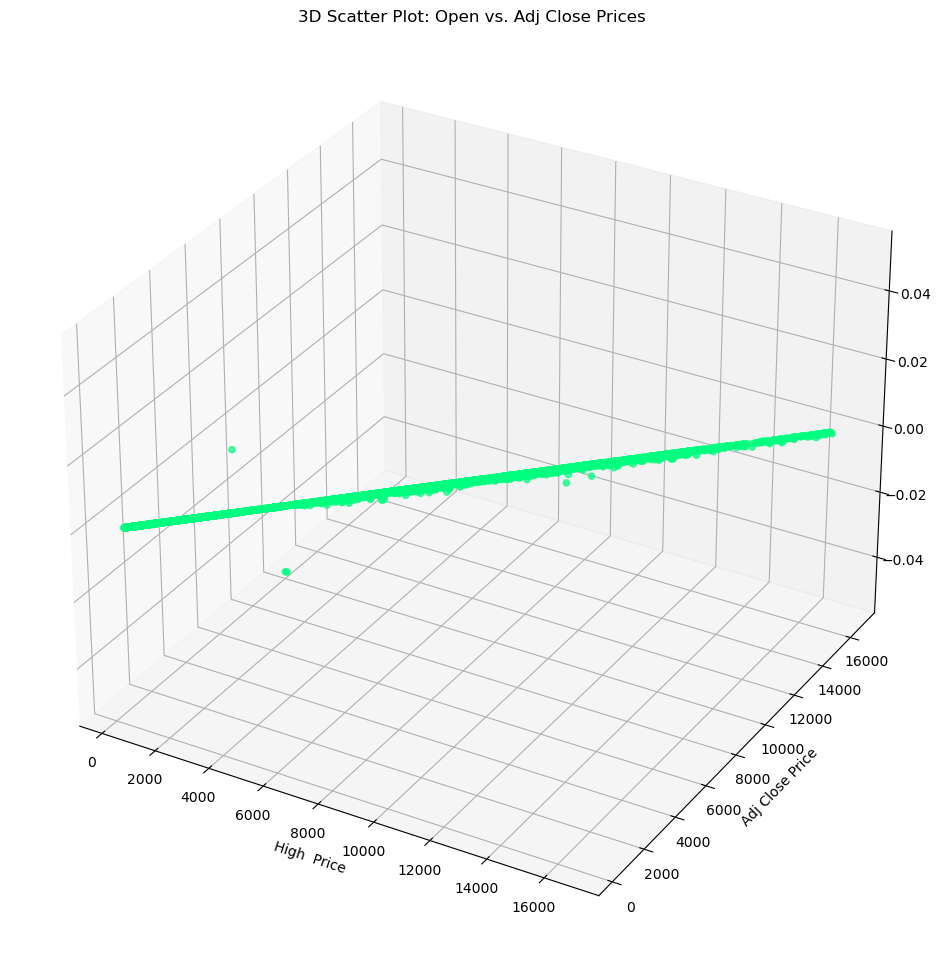

In [24]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(20, 12))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(DF['High'], DF['Adj Close'], color="springgreen", alpha=0.7)

ax.set_xlabel('High  Price')
ax.set_ylabel('Adj Close Price')
ax.set_title('3D Scatter Plot: Open vs. Adj Close Prices')

plt.show()

There are two noise in the graph, and their ranges are as follows: Adj Close>6000 & High<1000 Adj Close<1000 & High>5000

## Relationship between Low Price and Adjusted Close Price

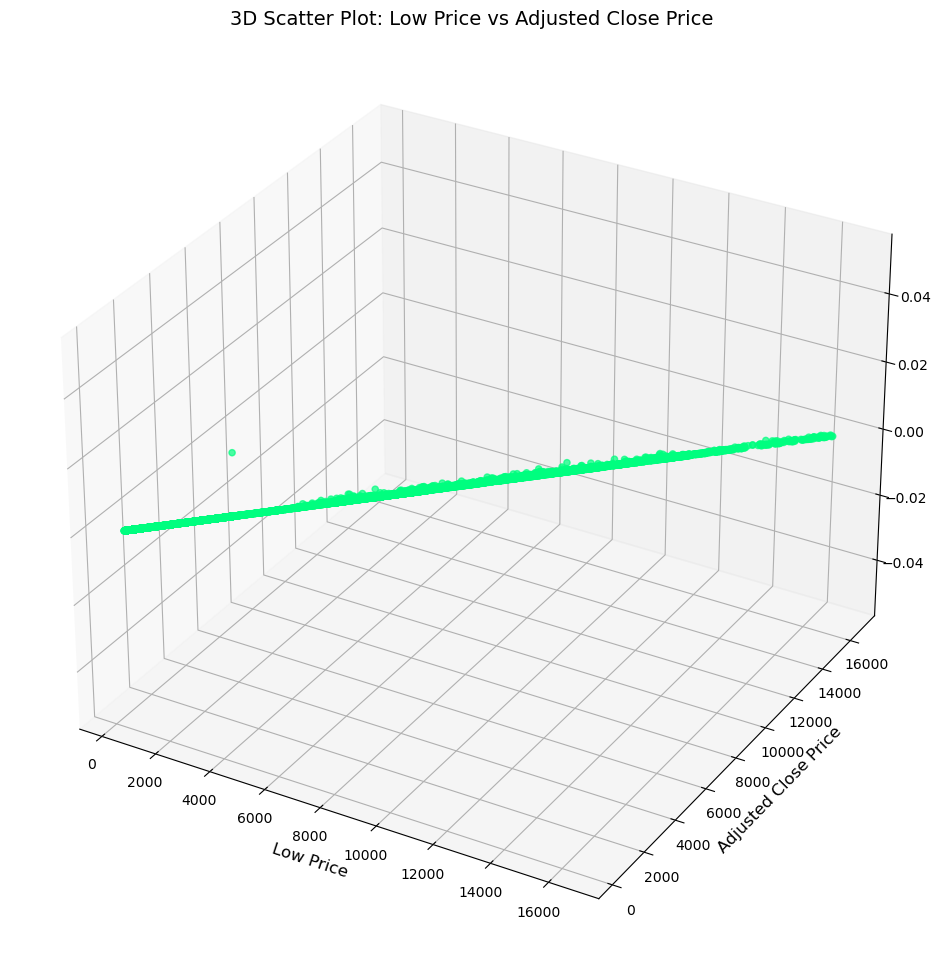

In [25]:
fig = plt.figure(figsize=(20, 12))
ax = fig.add_subplot(111, projection='3d')


ax.scatter(DF['Low'], DF['Adj Close'], color="springgreen", alpha=0.7)


ax.set_xlabel('Low Price', fontsize=12)
ax.set_ylabel('Adjusted Close Price', fontsize=12)
ax.set_title('3D Scatter Plot: Low Price vs Adjusted Close Price', fontsize=14)



plt.show()


There is a noise in the graph, the range of which is as follows: Adj Close>6000 & Low<1000

## Relationship between Close Price and Adjusted Close Price

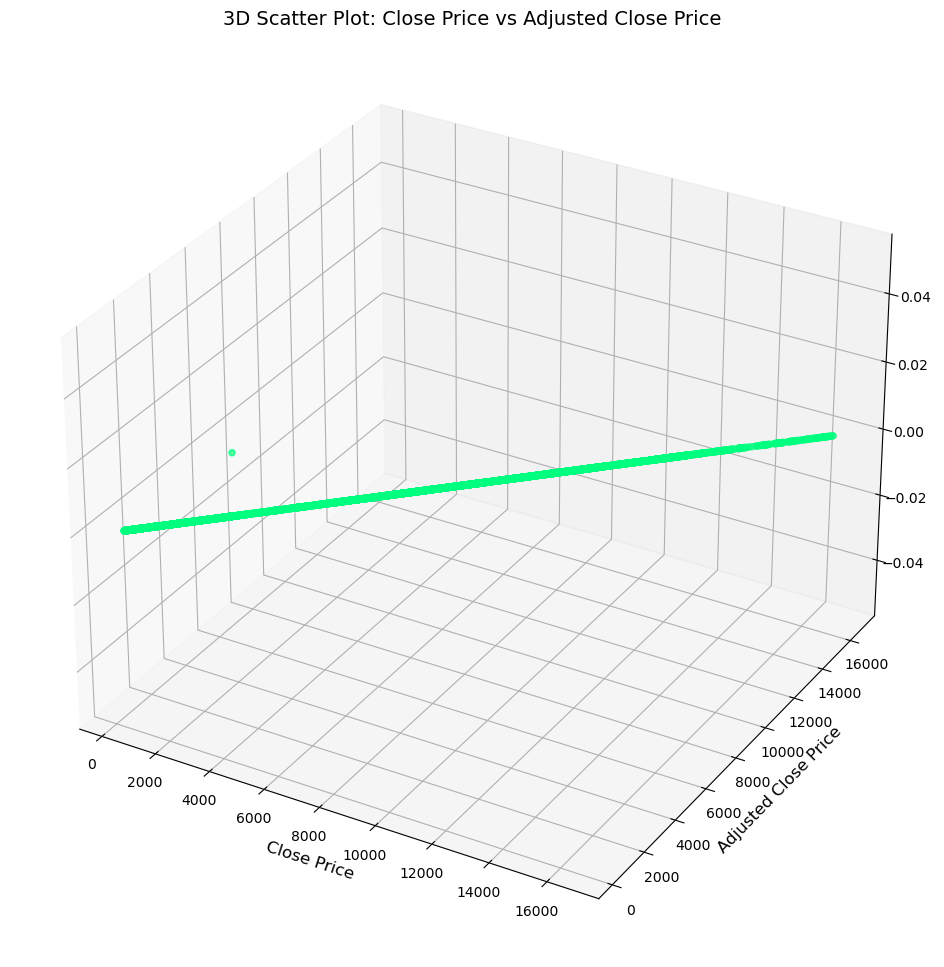

In [26]:
fig = plt.figure(figsize=(20, 12))
ax = fig.add_subplot(111, projection='3d')


scatter = ax.scatter(DF['Close'], DF['Adj Close'], color="springgreen", alpha=0.7)

ax.set_xlabel('Close Price', fontsize=12)
ax.set_ylabel('Adjusted Close Price', fontsize=12)
ax.set_title('3D Scatter Plot: Close Price vs Adjusted Close Price', fontsize=14)


plt.show()

There is a noise in the graph, the range of which is as follows: Adj Close>6000 & Close<1000

## Relationship between Volume and Adjusted Close Price.

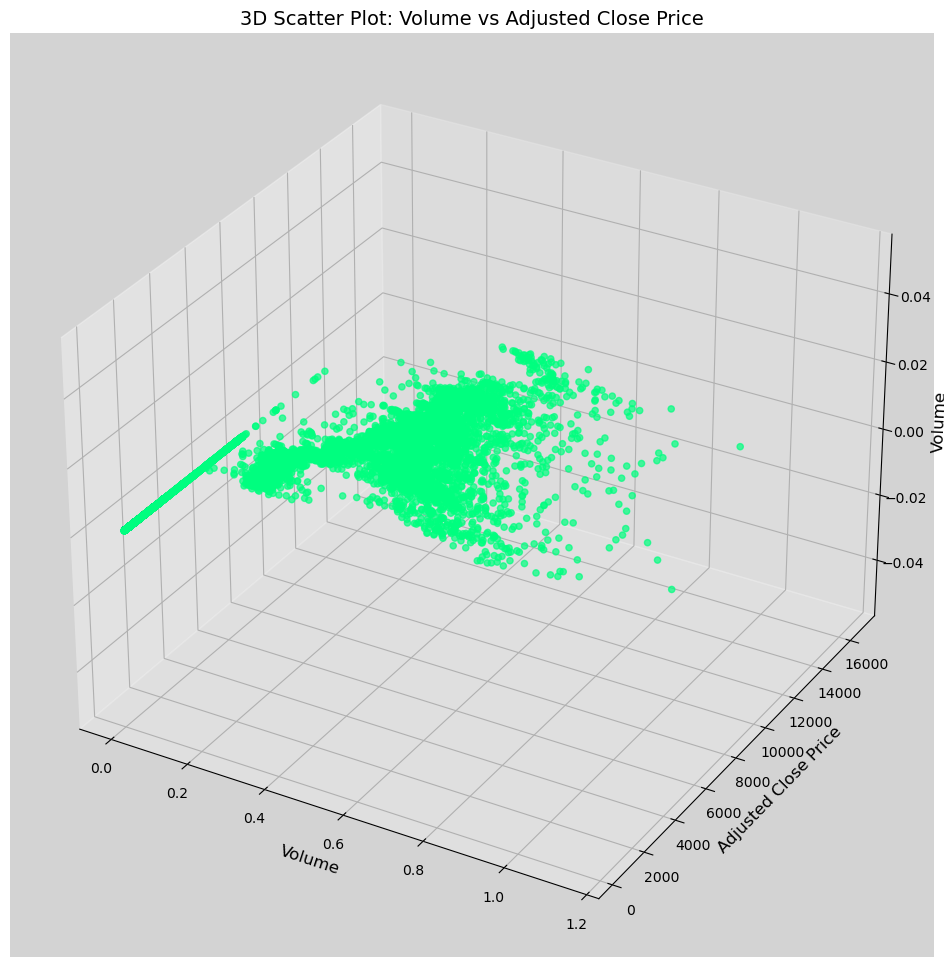

In [27]:
fig = plt.figure(figsize=(20, 12))
ax = fig.add_subplot(111, projection='3d')


scatter = ax.scatter(DF['Volume'], DF['Adj Close'], color="springgreen", alpha=0.7)

ax.set_xlabel('Volume', fontsize=12)
ax.set_ylabel('Adjusted Close Price', fontsize=12)
ax.set_zlabel('Volume', fontsize=12)
ax.set_title('3D Scatter Plot: Volume vs Adjusted Close Price', fontsize=14)



ax.set_facecolor('lightgrey')

plt.show()

In [28]:
count_of_zero_volume = DF[DF['Volume'] == 0]["Volume"].count()

In [29]:
count_of_zero_volume

8817

In [30]:
count_of_nonzero_volume = DF[DF['Volume'] != 0]["Volume"].count()

In [31]:
count_of_nonzero_volume

5115

In [32]:
#Top 10 largest values in the 'Volume' column

largest = DF['Volume'].nlargest(10)
largest

10768    1.145623e+10
11162    1.061781e+10
10752    1.008269e+10
13862    9.878040e+09
10798    9.495900e+09
11163    9.472910e+09
10750    9.459830e+09
10751    9.431870e+09
10753    9.387170e+09
10911    9.120100e+09
Name: Volume, dtype: float64

In [33]:
#the top 5 smallest values in the 'Volume' column

smallest = DF['Volume'].nsmallest(5)
smallest

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Volume, dtype: float64

The Volume column contains more zero data than non-zero data. Considering them as noise, and given their significant count, we have decided to delete this column.

# Removing missing values

In [34]:
DF1 = DF.drop(columns = ['Volume'], axis=1)

In [35]:
DF1

,Index,date,year,month,Open,High,Low,Close,Adj Close
0,NYA,1965-12-31,1965,December,529.0,529.0,529.0,529.0,529.0
1,NYA,1966-01-03,1966,January,527.0,527.0,527.0,527.0,527.0
2,NYA,1966-01-04,1966,January,528.0,528.0,528.0,528.0,528.0
3,NYA,1966-01-05,1966,January,531.0,531.0,531.0,531.0,531.0
4,NYA,1966-01-06,1966,January,532.0,532.0,532.0,532.0,532.0
...,...,...,...,...,...,...,...,...,...
13943,NYA,2021-05-24,2021,May,16375.0,16509.0,16375.0,16465.0,16465.0
13944,NYA,2021-05-25,2021,May,16465.0,16526.0,16375.0,16390.0,16390.0
13945,NYA,2021-05-26,2021,May,16390.0,16466.0,16388.0,16452.0,16452.0
13946,NYA,2021-05-27,2021,May,16452.0,16546.0,16452.0,16532.0,16532.0


In [36]:
DF1.describe()

,date,Open,High,Low,Close,Adj Close
count,13932,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000
mean,1993-10-05 15:37:21.860465024,4456.382142,4473.279859,4437.910996,4456.411570,4456.806273
min,1965-12-31 00:00:00,348.000000,348.000000,348.000000,348.000000,348.000000
25%,1979-12-19 18:00:00,656.000000,656.000000,656.000000,656.000000,656.000000
50%,1993-09-29 12:00:00,2634.000000,2634.000000,2634.000000,2634.000000,2634.000000
75%,2007-07-30 06:00:00,7348.500000,7384.250000,7281.250000,7346.500000,7346.500000
max,2021-05-28 00:00:00,16590.000000,16686.000000,16532.000000,16590.000000,16590.000000
std,NaN,4074.977658,4095.103590,4052.942082,4075.605456,4075.499391


In [37]:
print("\n Show the missing values of DataFrame :\n\n")

DF1.isnull().sum()


 Show the missing values of DataFrame :




Index        0
date         0
year         0
month        0
Open         0
High         0
Low          0
Close        0
Adj Close    0
dtype: int64

### print the DataFrame Noise, which contains only the rows from DF1 that meet the specified conditions.

##### CONDITION1 : Adj Close>6000 & Open<1000

In [38]:
Noise = DF1[(DF1["Adj Close"]>6000) & (DF1["Open"]<1000)]
Noise

,Index,date,year,month,Open,High,Low,Close,Adj Close
831,NYA,1969-05-29,1969,May,612.0,612.0,612.0,612.0,6111.0


#### CONDITION2 :  Adj Close<1000 &  Open>5000

In [39]:
Noise1 = DF1[(DF1['Adj Close']<2000) & (DF1["Open"]>4000)]
Noise1

,Index,date,year,month,Open,High,Low,Close,Adj Close
852,NYA,1969-06-30,1969,June,5722.0,572.0,572.0,572.0,572.0


Drop specific rows with index values 831 and 852 from the DataFrame df4

In [40]:
DF1.drop(index=[831,852], inplace = True)

## Scatterplot to remove noise.

### Relationship between Open Price and Adjusted Close Price

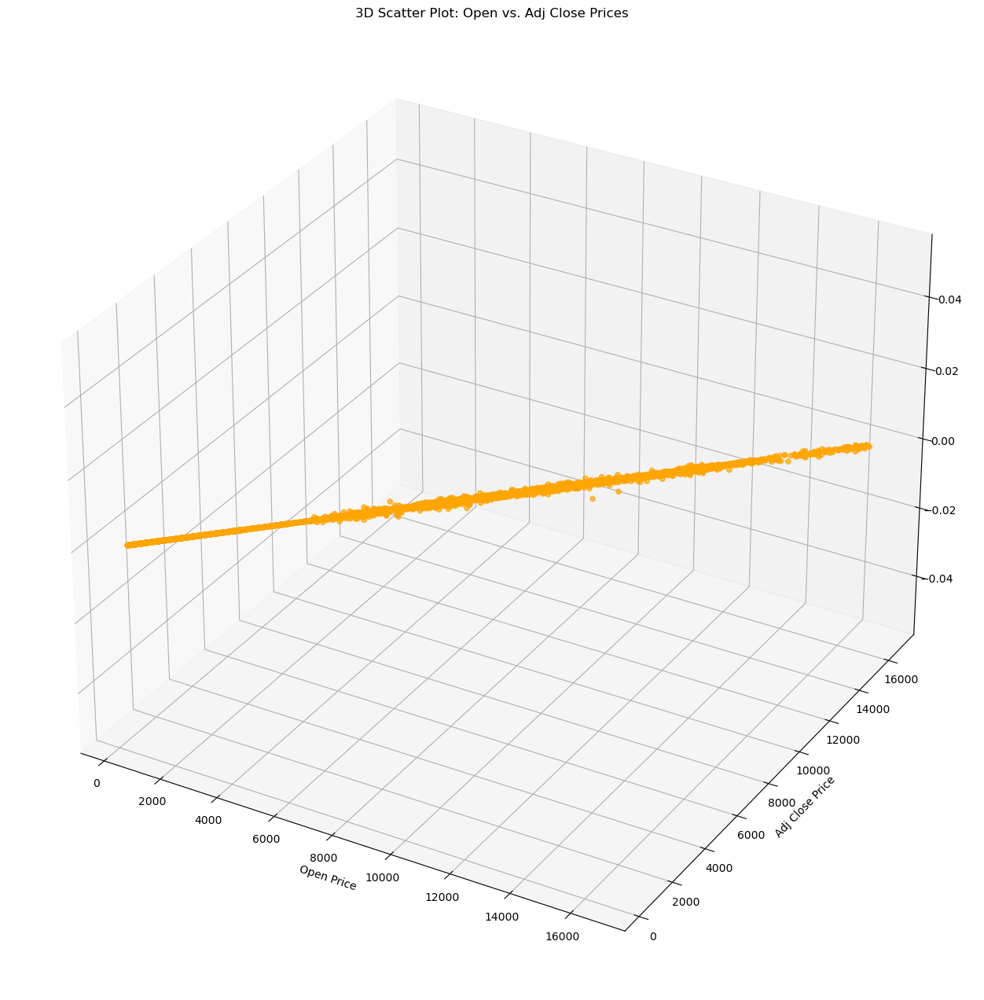

In [41]:
#Scatterplot to remove noise.
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')


ax.scatter(DF1['Open'], DF1['Adj Close'], color="Orange", alpha=0.7)

ax.set_xlabel('Open Price')
ax.set_ylabel('Adj Close Price')
ax.set_title('3D Scatter Plot: Open vs. Adj Close Prices')

plt.show()


Open price increases with an increase in adjusted close price.



### Relationship between High Price and Adjusted Close Price

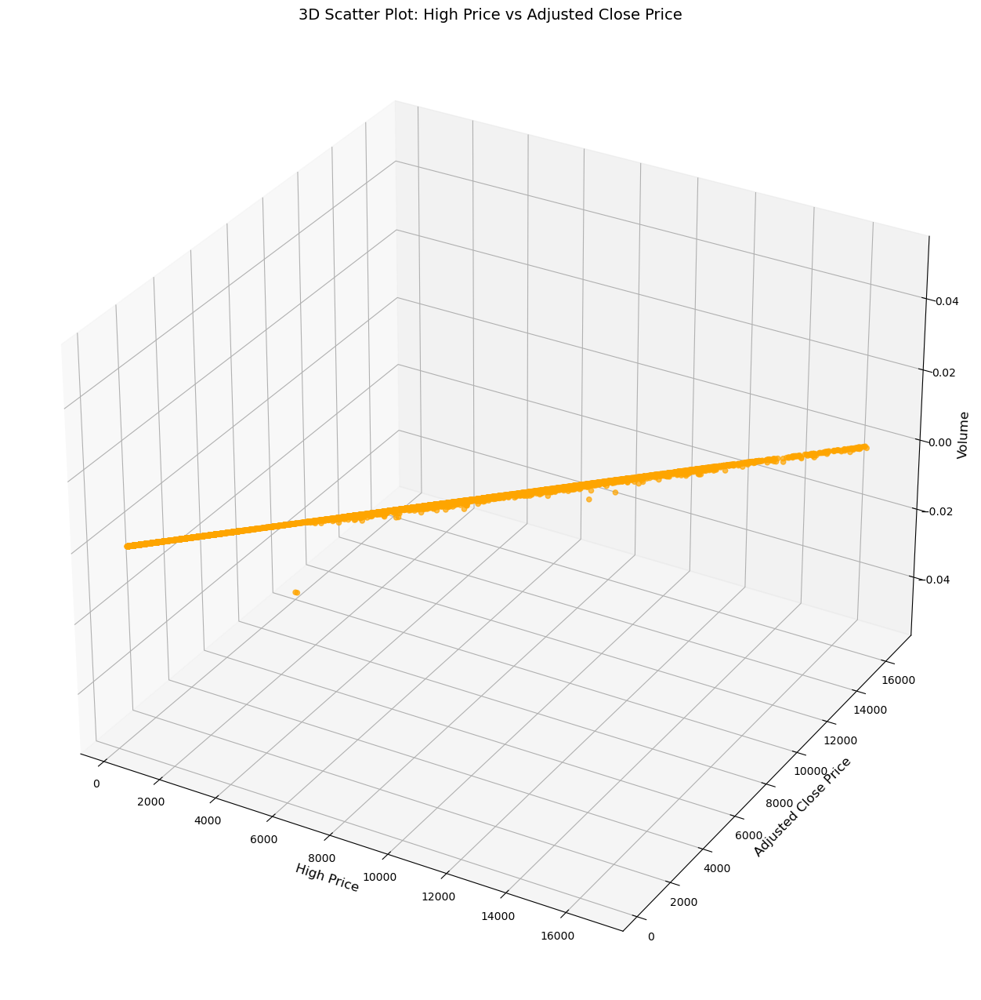

In [42]:

fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(DF1['High'], DF1['Adj Close'], color="Orange", alpha=0.7)

ax.set_xlabel('High Price', fontsize=12)
ax.set_ylabel('Adjusted Close Price', fontsize=12)
ax.set_zlabel('Volume', fontsize=12)
ax.set_title('3D Scatter Plot: High Price vs Adjusted Close Price', fontsize=14)



plt.show()

### CONDITION3 : Adj Close<1000 & High>5000


In [43]:
Noise2 = DF1[(DF1['Adj Close']<1000) & (DF1["High"]>5000)]
Noise2

,Index,date,year,month,Open,High,Low,Close,Adj Close
829,NYA,1969-05-27,1969,May,612.0,6124.0,612.0,612.0,612.0
833,NYA,1969-06-03,1969,June,607.0,6066.0,607.0,607.0,607.0


Drop specific rows with index values 829 and 833 from the DataFrame DF1

In [44]:
DF1.drop(index=[829,833], inplace=True)

## Relationship between High Price and Adjusted Close Price.


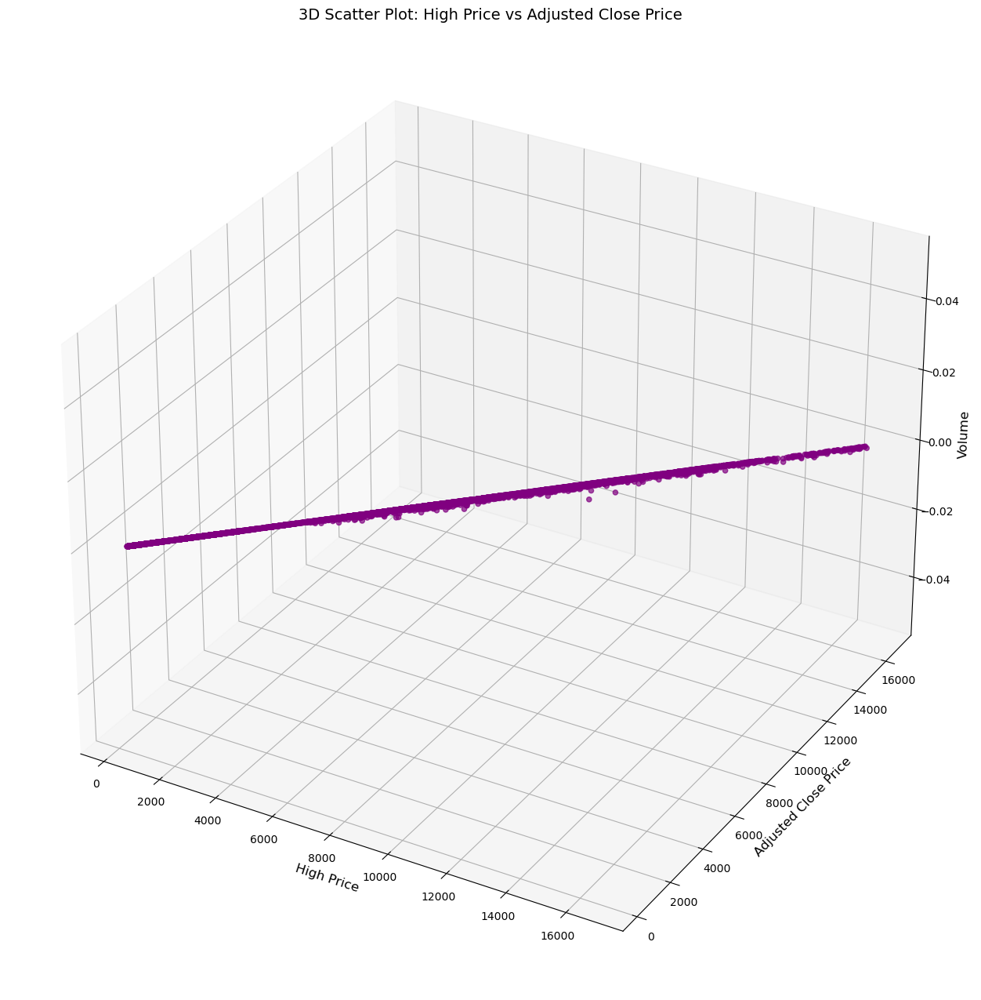

In [45]:
fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(DF1['High'], DF1['Adj Close'], color="Purple", alpha=0.7)

ax.set_xlabel('High Price', fontsize=12)
ax.set_ylabel('Adjusted Close Price', fontsize=12)
ax.set_zlabel('Volume', fontsize=12)
ax.set_title('3D Scatter Plot: High Price vs Adjusted Close Price', fontsize=14)


#ax.set_facecolor('lightgrey')

plt.show()

High price increases with an increase in adjusted close price.



## Relationship between Low Price and Adjusted Close Price

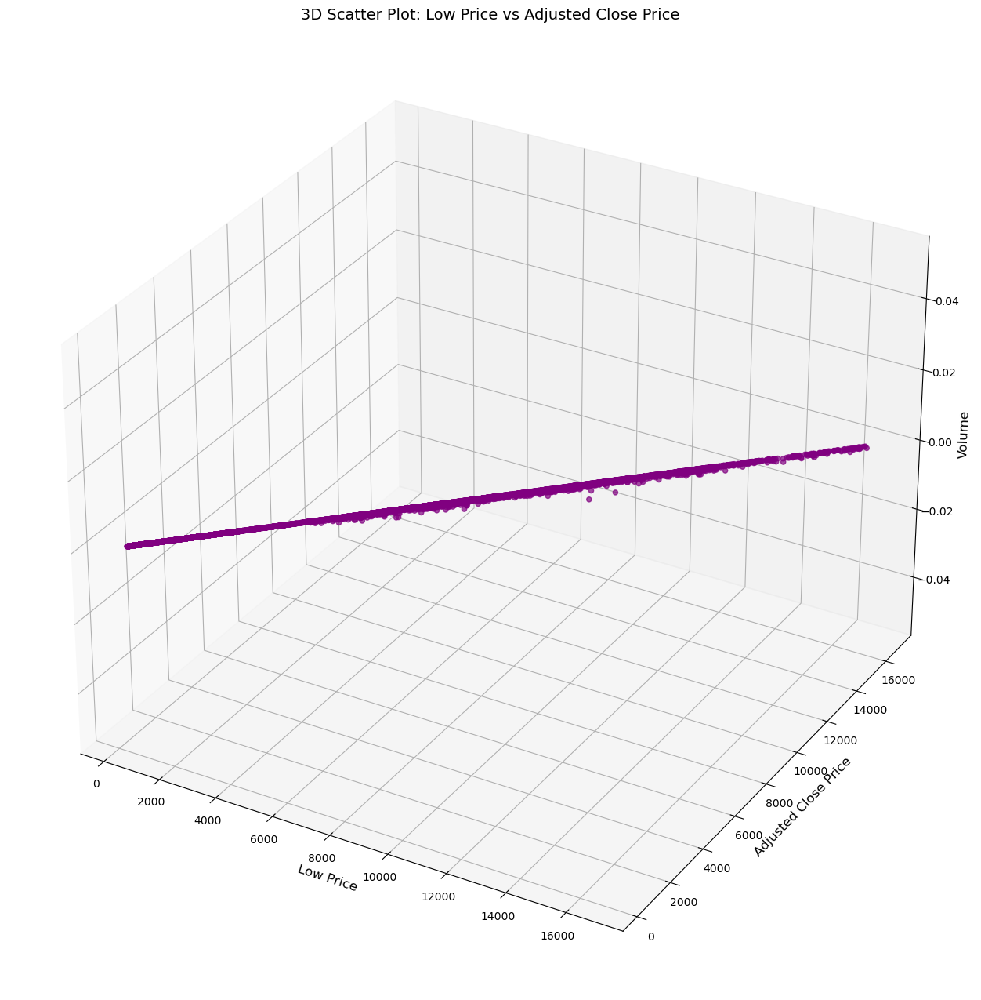

In [46]:

fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(DF1['High'], DF1['Adj Close'], color="Purple", alpha=0.7)

ax.set_xlabel('Low Price', fontsize=12)
ax.set_ylabel('Adjusted Close Price', fontsize=12)
ax.set_zlabel('Volume', fontsize=12)
ax.set_title('3D Scatter Plot: Low Price vs Adjusted Close Price', fontsize=14)



plt.show()

Low price increases with an increase in adjusted close price.



## Relationship between Close Price and Adjusted Close Price.

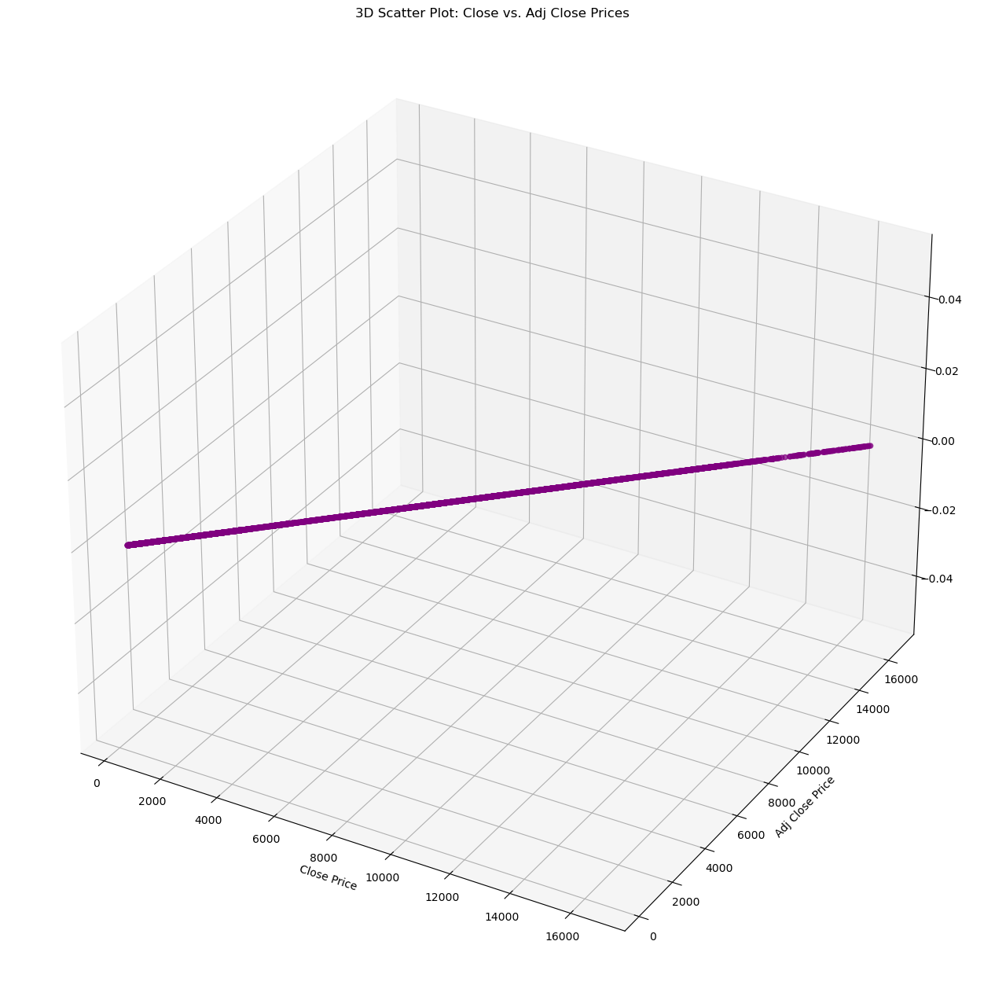

In [47]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')


ax.scatter(DF1['Close'], DF1['Adj Close'], color="Purple", alpha=0.7)

ax.set_xlabel('Close Price')
ax.set_ylabel('Adj Close Price')
ax.set_title('3D Scatter Plot: Close vs. Adj Close Prices')

plt.show()

Close price increases with an increase in adjusted close price.



# DataFrame After Removing Missing Values And Noise

In [48]:
DF1

,Index,date,year,month,Open,High,Low,Close,Adj Close
0,NYA,1965-12-31,1965,December,529.0,529.0,529.0,529.0,529.0
1,NYA,1966-01-03,1966,January,527.0,527.0,527.0,527.0,527.0
2,NYA,1966-01-04,1966,January,528.0,528.0,528.0,528.0,528.0
3,NYA,1966-01-05,1966,January,531.0,531.0,531.0,531.0,531.0
4,NYA,1966-01-06,1966,January,532.0,532.0,532.0,532.0,532.0
...,...,...,...,...,...,...,...,...,...
13943,NYA,2021-05-24,2021,May,16375.0,16509.0,16375.0,16465.0,16465.0
13944,NYA,2021-05-25,2021,May,16465.0,16526.0,16375.0,16390.0,16390.0
13945,NYA,2021-05-26,2021,May,16390.0,16466.0,16388.0,16452.0,16452.0
13946,NYA,2021-05-27,2021,May,16452.0,16546.0,16452.0,16532.0,16532.0


The number of rows has decreased from 13932 to 13928.



# Analysis

## Linear Analysis

The fifth step is linear analysis of Adj Close with Date



In [49]:
import pandas as pd
import plotly.express as px

# Convert "Date" column to datetime format
DF1['date'] = pd.to_datetime(DF1['date'])

# Create a line plot using Plotly Express with custom colors
figure = px.line(DF1, x="date", y='Adj Close', 
                 title='Linear Analysis of Adj Close over Date',
                 color_discrete_sequence=['red'])  # Change the color to red

# Show the plot
figure.show()


In [50]:
import pandas as pd

# Convert "Date" column to datetime format
DF1['date'] = pd.to_datetime(DF1['date'])
figure = px.line(DF1, x="date", 
                 y='Adj Close', 
                 title='Linear Analysis of Adj Close over Time ')
figure.show()


As the years increase, the Adj Close values on the graph ascend.



## Assuming 'month' is a numeric column ranging from 1 to 12

In [51]:
import plotly.express as px

figure = px.pie(DF1, 
                values='Adj Close', 
                names='month', 
                hole=0.3,  # Adjust the size of the hole in the middle of the pie chart
                color='month',  
                color_discrete_sequence=px.colors.qualitative.Pastel,  # Use a qualitative color palette
                title="Pie Chart of Adj Close Values by month")

# Update layout and traces for better aesthetics
figure.update_layout(
    title="Pie Chart of Adj Close Values by month",
    legend_title_text='month',  # Set legend title
    legend=dict(x=0.85, y=0.5),  # Position the legend
    margin=dict(t=50, l=0, r=50, b=0),  # Adjust margins
    font=dict(family="Arial", size=12),  # Customize font
    hoverlabel=dict(bgcolor="white", font_size=12),  # Customize hover label

)  
    

figure.update_traces(
    marker=dict(line=dict(color='white', width=2)),  # Add a white border around each slice
    textposition='inside',  # Position text inside each slice
    textinfo='percent+label'  # Show percentage and label inside each slice
)

# Show the pie chart
figure.show()

In [52]:
import plotly.graph_objects as go

# Create the candlestick chart
figure = go.Figure(data=[go.Candlestick(x=DF1.index,
                                        open=DF1["Open"],
                                        high=DF1["High"],
                                        low=DF1["Low"],
                                        close=DF1["Adj Close"],
                                        increasing_line_color='green',  # Color for increasing values
                                        decreasing_line_color='red'  # Color for decreasing values
                                       )])

# Update layout for better aesthetics
figure.update_layout(
    title="Time Series Analysis (Candlestick Chart)",
    xaxis_title="Date",
    yaxis_title="Price",
    xaxis_rangeslider_visible=False,
    plot_bgcolor='rgb(255, 255, 255)',  # Background color
    paper_bgcolor='rgb(243, 243, 243)',  # Paper color
    font=dict(family="Arial", size=12, color="black"),  # Font customization
    margin=dict(t=50, l=50, r=50, b=50),  # Adjust margins
)

# Update the appearance of the grid
figure.update_xaxes(showgrid=True, gridwidth=1, gridcolor='rgba(0, 0, 0, 0.1)')
figure.update_yaxes(showgrid=True, gridwidth=1, gridcolor='rgba(0, 0, 0, 0.1)')

# Show the candlestick chart
figure.show()


# Time Series Analysis (Bar Plot)

In [53]:
import plotly.express as px

# Create the bar plot
figure = px.bar(DF1,  
                x=DF1.index, 
                y="Adj Close",
                title="Time Series Analysis (Bar Plot)",
                color="Adj Close",
                color_discrete_map={"Adj Close": "rgb(255, 127, 14)"}  # Bright orange color
               )

# Update layout for better aesthetics
figure.update_layout(
    xaxis_title="Date",
    yaxis_title="Adj Close",
    plot_bgcolor='rgba(0, 0, 0, 0)',  # Set plot background color to transparent
    paper_bgcolor='rgba(0, 0, 0, 0)',  # Set paper background color to transparent
    font=dict(color='black'),  # Set font color to black
)

# Show the bar plot
figure.show()


## Distribution Plot of Year


In [54]:
import plotly.graph_objects as go

# Create a histogram using Plotly Graph Objects
fig = go.Figure(data=[go.Histogram(x=DF1['year'])])

# Update layout for better aesthetics
fig.update_layout(
    title='Distribution of Years',
    xaxis_title='Year',
    yaxis_title='Frequency',
)

fig.show()


In [55]:
import plotly.graph_objects as go

# Create a 3D line plot
figure = go.Figure(data=[go.Scatter3d(
    x=DF1['date'],
    y=DF1['Adj Close'],
    z=[0]*len(DF1),  # Set z-values to 0 for all points
    mode='lines',
    line=dict(color='blue', width=2),  # Customize line color and width
)])

# Update layout for better aesthetics
figure.update_layout(
    title="3D Line Plot of Adj Close over Time",
    scene=dict(
        xaxis_title="Date",
        yaxis_title="Adj Close",
        zaxis_title="Count",
    ),
    margin=dict(l=40, r=40, t=60, b=40),  # Adjust margins
)

# Show the 3D line plot
figure.show()


In [56]:
DF1

,Index,date,year,month,Open,High,Low,Close,Adj Close
0,NYA,1965-12-31,1965,December,529.0,529.0,529.0,529.0,529.0
1,NYA,1966-01-03,1966,January,527.0,527.0,527.0,527.0,527.0
2,NYA,1966-01-04,1966,January,528.0,528.0,528.0,528.0,528.0
3,NYA,1966-01-05,1966,January,531.0,531.0,531.0,531.0,531.0
4,NYA,1966-01-06,1966,January,532.0,532.0,532.0,532.0,532.0
...,...,...,...,...,...,...,...,...,...
13943,NYA,2021-05-24,2021,May,16375.0,16509.0,16375.0,16465.0,16465.0
13944,NYA,2021-05-25,2021,May,16465.0,16526.0,16375.0,16390.0,16390.0
13945,NYA,2021-05-26,2021,May,16390.0,16466.0,16388.0,16452.0,16452.0
13946,NYA,2021-05-27,2021,May,16452.0,16546.0,16452.0,16532.0,16532.0


# Scatter plot for multivariate analysis

In [57]:
import plotly.graph_objects as go
import pandas as pd

# Convert month names to numerical values
month_values = pd.to_datetime(DF1['month'], format='%B').dt.month

# Create a 3D scatter plot
figure = go.Figure(data=[go.Scatter3d(
    x=DF1['year'],
    y=DF1['Adj Close'],
    z=month_values,
    mode='markers',
    marker=dict(
        size=5,  # Adjust marker size
        color=month_values,  # Set marker color based on month
        colorscale='Viridis',  # Choose a color scale
        opacity=0.8  # Adjust marker opacity
    )
)])

# Update layout for better aesthetics
figure.update_layout(
    title="Multivariate Analysis of Adj Close, Year, and Month",
    scene=dict(
        xaxis_title="Year",
        yaxis_title="Adj Close",
        zaxis_title="Month"
    ),
    margin=dict(l=40, r=40, t=60, b=40),  # Adjust margins
)

# Show the 3D scatter plot
figure.show()


### Specify the number of years for each period


In [58]:
years_per_period = 10

# Get the minimum and maximum years in your DataFrame
min_year = DF1['date'].dt.year.min()
max_year = DF1['date'].dt.year.max()

# Create a list to store DataFrames for each period
period_dfs = []

# Iterate through each period
for start_year in range(min_year, max_year + 1, years_per_period):
    end_year = start_year + years_per_period - 1
    period_df = DF1[(DF1['date'].dt.year >= start_year) & (DF1['date'].dt.year <= end_year)]
    period_df['Period'] = f"{start_year}-{end_year}"  # Add a new column 'Period'
    period_dfs.append(period_df)

# Concatenate the resulting DataFrames back into a single DataFrame
result_df = pd.concat(period_dfs, ignore_index=True)

# Display the resulting DataFrame
result_df

,Index,date,year,month,Open,High,Low,Close,Adj Close,Period
0,NYA,1965-12-31,1965,December,529.0,529.0,529.0,529.0,529.0,1965-1974
1,NYA,1966-01-03,1966,January,527.0,527.0,527.0,527.0,527.0,1965-1974
2,NYA,1966-01-04,1966,January,528.0,528.0,528.0,528.0,528.0,1965-1974
3,NYA,1966-01-05,1966,January,531.0,531.0,531.0,531.0,531.0,1965-1974
4,NYA,1966-01-06,1966,January,532.0,532.0,532.0,532.0,532.0,1965-1974
...,...,...,...,...,...,...,...,...,...,...
13923,NYA,2021-05-24,2021,May,16375.0,16509.0,16375.0,16465.0,16465.0,2015-2024
13924,NYA,2021-05-25,2021,May,16465.0,16526.0,16375.0,16390.0,16390.0,2015-2024
13925,NYA,2021-05-26,2021,May,16390.0,16466.0,16388.0,16452.0,16452.0,2015-2024
13926,NYA,2021-05-27,2021,May,16452.0,16546.0,16452.0,16532.0,16532.0,2015-2024


In [59]:
import plotly.graph_objects as go
import pandas as pd

# Create a pivot table for heatmap data
heatmap_data = result_df.pivot_table(values='Adj Close', columns='month', index='Period', aggfunc='mean')

# Create traces for heatmap
trace = go.Heatmap(z=heatmap_data.values,
                   x=heatmap_data.columns,
                   y=heatmap_data.index,
                   colorscale='hot',  # Choose a color scale
                   colorbar=dict(title='Adj Close', tickformat=".2f"))  # Add color bar

# Create layout
layout = go.Layout(title='Heatmap of Adj Close Values by Month and Period',
                   xaxis=dict(title='Month'),
                   yaxis=dict(title='Period'))

# Create figure
figure = go.Figure(data=[trace], layout=layout)

# Show the heatmap
figure.show()


## Filter data for the years 2015 to 2024


In [60]:
import plotly.graph_objects as go
import pandas as pd

# Filter data for the years 2015 to 2024
filtered_df = DF1[(DF1['date'].dt.year >= 2015) & (DF1['date'].dt.year <= 2024)]

# Get the maximum year in the filtered data
max_year_last_period = filtered_df['date'].dt.year.max()

# Filter data for the last 10 years
last_10_years_df = filtered_df[filtered_df['date'].dt.year >= max_year_last_period - 9]

# Pivot the DataFrame to create a matrix suitable for a heatmap
heatmap_data = last_10_years_df.pivot_table(values='Adj Close', index='month', columns='year', aggfunc='mean')

# Create traces for heatmap
trace = go.Heatmap(z=heatmap_data.values,
                   x=heatmap_data.columns,
                   y=heatmap_data.index,
                   colorscale='hot',  # Choose a color scale
                   colorbar=dict(title='Adj Close', tickformat=".2f"),  # Add color bar
                   zmin=heatmap_data.values.min(),  # Set minimum z-value
                   zmax=heatmap_data.values.max())  # Set maximum z-value

# Create layout
layout = go.Layout(title='Heatmap of Adj Close Values for the Last 10 Years (2015-2024)',
                   xaxis=dict(title='Year'),
                   yaxis=dict(title='Month'))

# Create figure
figure = go.Figure(data=[trace], layout=layout)

# Show the heatmap
figure.show()


## Filter data for the years 1965 to 1974


In [61]:
import plotly.graph_objects as go
import pandas as pd

# Filter data for the first 10 years (1965-1974)
first_period_df = DF1[(DF1['date'].dt.year >= 1965) & (DF1['date'].dt.year <= 1974)]

# Pivot the DataFrame to create a matrix suitable for a heatmap
heatmap_data = first_period_df.pivot_table(values='Adj Close', index='month', columns='year', aggfunc='mean')

# Create traces for heatmap
trace = go.Heatmap(z=heatmap_data.values,
                   x=heatmap_data.columns,
                   y=heatmap_data.index,
                   colorscale='hot',  # Choose a color scale
                   colorbar=dict(title='Adj Close', tickformat=".2f"),  # Add color bar
                   zmin=heatmap_data.values.min(),  # Set minimum z-value
                   zmax=heatmap_data.values.max())  # Set maximum z-value

# Create layout
layout = go.Layout(title='Heatmap of Adj Close Values for the First 10 Years (1965-1974)',
                   xaxis=dict(title='Year'),
                   yaxis=dict(title='Month'))

# Create figure
figure = go.Figure(data=[trace], layout=layout)

# Show the heatmap
figure.show()


## Pie Chart of Adj Close Values by Period


In [62]:
import plotly.graph_objects as go

# Create a pie chart
figure = go.Figure(data=[go.Pie(
    labels=result_df['Period'],  # Set labels to periods
    values=result_df['Adj Close'],  # Set values to Adj Close
    hole=0.25,
    marker=dict(line=dict(color='white', width=2)),  # Add a white border around slices
    text=result_df['Period'].astype(str),  # Display period labels
    title="Pie Chart of Adj Close Values by Period"
)])

# Update layout for better aesthetics
figure.update_layout(
    title="Pie Chart of Adj Close Values by Period",
    legend_title_text='Period',  # Add a legend title for periods
    width=1000,  # Adjust chart width
    height=800  # Adjust chart height
)

# Show the pie chart
figure.show()


In [63]:
last_10_years_df = DF1[DF1['date'].dt.year >= DF1['date'].dt.year.max() - 9]
last_10_years_df

,Index,date,year,month,Open,High,Low,Close,Adj Close
11581,NYA,2012-01-03,2012,January,7477.0,7660.0,7459.0,7624.0,7624.0
11582,NYA,2012-01-04,2012,January,7624.0,7624.0,7560.0,7612.0,7612.0
11583,NYA,2012-01-05,2012,January,7612.0,7614.0,7513.0,7600.0,7600.0
11584,NYA,2012-01-06,2012,January,7600.0,7601.0,7536.0,7558.0,7558.0
11585,NYA,2012-01-09,2012,January,7558.0,7589.0,7539.0,7585.0,7585.0
...,...,...,...,...,...,...,...,...,...
13943,NYA,2021-05-24,2021,May,16375.0,16509.0,16375.0,16465.0,16465.0
13944,NYA,2021-05-25,2021,May,16465.0,16526.0,16375.0,16390.0,16390.0
13945,NYA,2021-05-26,2021,May,16390.0,16466.0,16388.0,16452.0,16452.0
13946,NYA,2021-05-27,2021,May,16452.0,16546.0,16452.0,16532.0,16532.0


## Heatmap of Adj Close over the Last 10 Years and Months


In [64]:
import plotly.graph_objects as go
import pandas as pd

# Pivot the DataFrame to create a matrix suitable for a heatmap
heatmap_data = last_10_years_df.pivot_table(index='year', columns='month', values='Adj Close')

# Create traces for heatmap
trace = go.Heatmap(z=heatmap_data.values,
                   x=heatmap_data.columns,
                   y=heatmap_data.index,
                   colorscale='viridis',  # Choose a color scale
                   colorbar=dict(title='Adj Close', tickformat=".2f"),  # Add color bar
                   zmin=heatmap_data.values.min(),  # Set minimum z-value
                   zmax=heatmap_data.values.max())  # Set maximum z-value

# Create layout
layout = go.Layout(title='Heatmap of Adj Close over the Last 10 Years and Months',
                   xaxis=dict(title='Month'),
                   yaxis=dict(title='Year'))

# Create figure
figure = go.Figure(data=[trace], layout=layout)

# Show the heatmap
figure.show()
